In [52]:
import matplotlib.pyplot as plt
import numpy as np
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import expon
from scipy.optimize import curve_fit
import time

print("hello world")
%matplotlib inline

hello world


In [53]:

# Constants
ELECTRON_MASS_ENERGY = 511  # keV

def rotate_vector(vector, theta, phi):
    """
    Rotate a 3D vector by the polar angle (theta) and azimuthal angle (phi).
    
    :param vector: The original vector to rotate.
    :param theta: The polar angle (rotation around y-axis).
    :param phi: The azimuthal angle (rotation around z-axis).
    :return: Rotated vector.
    """
    # Rotation matrix around the z-axis (azimuthal angle, phi)
    R_phi = np.array([
        [np.cos(phi), -np.sin(phi), 0],
        [np.sin(phi), np.cos(phi),  0],
        [0,           0,            1]
    ])
    
    # Rotation matrix around the y-axis (polar angle, theta)
    R_theta = np.array([
        [np.cos(theta), 0, np.sin(theta)],
        [0,             1, 0           ],
        [-np.sin(theta), 0, np.cos(theta)]
    ])
    
    # Apply the rotations: first by theta, then by phi
    rotated_vector = np.dot(R_phi, np.dot(R_theta, vector))
    
    return rotated_vector

def generate_photon(energy, polarization, incidence_angle, incidence_point):
    return {
        'energy': energy,
        'polarization': np.array(polarization),
        'direction': np.array([np.sin(incidence_angle[0])*np.cos(incidence_angle[1]), np.sin(incidence_angle[0])*np.sin(incidence_angle[1]), np.cos(incidence_angle[0])]),
        'position': np.array(incidence_point)
    }

def simulate_interaction_position(photon, detector_size):
    attenuation_coeff = 2.64  # cm^-1, example value
    distance = expon.rvs(scale=1/attenuation_coeff)
    new_position = photon['position'] + distance * photon['direction']
    print(f"direction: {photon['direction']}")
    print(f"New position: {new_position}")
    if (-detector_size[0]/2 <= new_position[0] <= detector_size[0]/2 and
        -detector_size[0]/2 <= new_position[1] <= detector_size[1]/2 and
        0 <= new_position[2] <= detector_size[2]):
        return new_position
    return None

import numpy as np

def klein_nishina_cross_section(energy, cos_theta, cos_phi, re=2.817e-13):
    """
    Calculates the Klein-Nishina differential cross-section for Compton scattering of a linearly polarized photon
    in terms of the alpha parameter (ratio of photon energy to electron rest mass energy).
    
    Parameters:
    alpha : float
        The ratio of the incoming photon energy to the electron rest mass energy (E_0 / (m_e c^2)).
    theta : float
        The scattering angle in radians.
    phi : float
        The angle between the polarization direction and the scattering plane in radians.
    re : float, optional
        Classical electron radius (in cm). Default is 2.817e-13 cm.
    
    Returns:
    float
        The differential cross-section in cm²/sr.
    """
    alpha=energy/ELECTRON_MASS_ENERGY
    # Ratio of scattered photon energy to initial photon energy
    epsilon_ratio = 1 / (1 + alpha * (1 -cos_theta))
    
    # Compute the Klein-Nishina differential cross section
    term1 = epsilon_ratio
    term2 = (1 / epsilon_ratio) + epsilon_ratio - 2 * (1-cos_theta**2) * (cos_phi**2)
    
    # Klein-Nishina cross section
    cross_section = 0.5 * re**2 * (term1**2) * term2*(np.sqrt(1-cos_theta**2))
    
    return cross_section

def compton_scattering(photon, max_iterations=10000):
    start_time = time.time()
    energy = photon['energy']
    
    # Calculate the maximum value of the Klein-Nishina cross-section for normalization
    theta_values = np.linspace(0, np.pi, 10000)
    phi_values = np.linspace(0, 2*np.pi, 10000)
    cos_theta_values = np.cos(theta_values)
    cos_phi_values = np.cos(phi_values)
    cross_sections = klein_nishina_cross_section(energy, cos_theta_values,cos_phi_values)
    max_cross_section = np.max(cross_sections)
    
    for i in range(max_iterations):
        theta = np.random.uniform(0, np.pi)
        phi = np.random.uniform(0, 2 * np.pi)
        # Acceptance condition: we use rejection sampling
        if np.random.uniform(0, max_cross_section) < klein_nishina_cross_section(energy, np.cos(theta), np.cos(phi))/max_cross_section:
            break
        else:
            print(f"Warning: Compton scattering did not converge after {max_iterations} iterations")
            return None, None, None
    
    # Calculate new energy
    energy_ratio = 1 / (1 + (energy / ELECTRON_MASS_ENERGY) * (1 - np.cos(theta)))
    new_energy = energy * energy_ratio
    
    new_direction = rotate_vector(photon['direction'], theta, phi)
    
    scattered_photon = photon.copy()
    scattered_photon['energy'] = new_energy
    scattered_photon['direction'] = new_direction
    
    end_time = time.time()
    print(f"Compton scattering time: {end_time - start_time:.4f} seconds")
    print(f"Rejection sampling iterations: {i+1}")
    print(f"Scattering angle (theta): {theta:.4f} radians")
    print(f"Azimuthal angle (phi): {phi:.4f} radians")
    print(f"Energy before: {energy:.2f} keV, Energy after: {new_energy:.2f} keV")
    
    return scattered_photon, theta, phi

def get_pixel_number(interaction_postion,detector_size):
    x = interaction_postion[0]
    y = interaction_postion[1]
    z = interaction_postion[2]
    pixel_number = 0

    if z < detector_size[2]:
        if x < -detector_size[0]/6 :
            if y< -detector_size[1]/6:
                pixel_number = 5
            elif y < detector_size[1]/6:
                pixel_number = 4
            else :
                pixel_number= 3
        elif x < detector_size[0]/6:
            if y< -detector_size[1]/6:
                pixel_number = 6
            elif y < detector_size[1]/6:
                pixel_number = -1
            else :
                pixel_number= 2
        else :
            if y< -detector_size[1]/6:
                pixel_number = 7
            elif y < detector_size[1]/6:
                pixel_number = 0
            else :
                pixel_number= 1
    else :
        pixel_number = -2
    
    return pixel_number

def get_phi_value(pixel_number):
    if pixel_number == 0:
        return 0
    elif pixel_number == 1:
        return np.pi/4
    elif pixel_number == 2:
        return 2*np.pi/4
    elif pixel_number == 3:
        return 3*np.pi/4
    elif pixel_number == 4:
        return 4*np.pi/4
    elif pixel_number == 5:
        return 5*np.pi/4
    elif pixel_number == 6:
        return 6*np.pi/4
    elif pixel_number == 7:
        return 7*np.pi/4
    else:
        return None
    

In [54]:
def simulate_detector(num_photons, detector_size, initial_energy, polarization, incidence_angle,randomise=False):
    phi_values = []
    
    for i in range(num_photons):
        start_time = time.time()
        print(f"\nSimulating photon {i+1}/{num_photons}")
        
        # Generate photon at the face of the detector
        if randomise==False:
            initial_position = np.array([0,0,0])
        else :
            initial_position = np.array([np.random.uniform(-detector_size[0]/6, detector_size[0]/6),
                                         np.random.uniform(-detector_size[1]/6, detector_size[1]/6),0])

        photon = generate_photon(initial_energy, polarization, incidence_angle, initial_position)
        
        print(f"Initial position: {photon['position']}")
        
        # First interaction
        interaction_pos = simulate_interaction_position(photon, detector_size)
        if interaction_pos is None:
            print(f"Photon escaped without interacting. Final position: {photon['position']}")
            continue
        
        photon['position'] = interaction_pos
        scattered_photon, theta, phi = compton_scattering(photon)
        
        if scattered_photon is None:
            print("Compton scattering failed. Skipping this photon.")
            continue
        
        print(f"First interaction:")
        print(f"  Position: {interaction_pos}")
        print(f"  Scattering angle (θ): {np.degrees(theta):.2f}°")
        print(f"  Azimuthal angle (φ): {np.degrees(phi):.2f}°")
        print(f"  Energy after scattering: {scattered_photon['energy']:.2f} keV")
        
        # Second interaction
        second_interaction_pos = simulate_interaction_position(scattered_photon, detector_size)
        if second_interaction_pos is not None:
            pixel_number=get_pixel_number(second_interaction_pos,detector_size)

            if pixel_number == -1:
                print("Single Pixel Event, Second Interaction is in the same pixel")
            elif pixel_number == -2 :
                print("Photon escaped into deeper layer")
            else:
                phi_detected=get_phi_value(pixel_number)
                phi_values.append(phi_detected)
                print(f"Second interaction:")
                print(f"Position: {second_interaction_pos}")
                print(f"Actual photon azimuthal angle: {phi}")
                print(f"Pixel number: {pixel_number}")
                print(f"Phi_Assigned : {phi_detected}")

        else:
            print("Photon escaped after first scattering")
        
        end_time = time.time()
        print(f"Total time for this photon: {end_time - start_time:.4f} seconds")
        print("--------------------")
    return phi_values


Starting simulation...

Simulating photon 1/10000
Initial position: [0 0 0]
direction: [0. 0. 1.]
New position: [0.         0.         0.36805441]
Compton scattering time: 0.0010 seconds
Rejection sampling iterations: 1
Scattering angle (theta): 0.4637 radians
Azimuthal angle (phi): 3.4301 radians
Energy before: 200.00 keV, Energy after: 192.06 keV
First interaction:
  Position: [0.         0.         0.36805441]
  Scattering angle (θ): 26.57°
  Azimuthal angle (φ): 196.53°
  Energy after scattering: 192.06 keV
direction: [-0.4287428  -0.12722399  0.89442365]
New position: [-0.28744315 -0.08529511  0.96770518]
Photon escaped after first scattering
Total time for this photon: 0.0020 seconds
--------------------

Simulating photon 2/10000
Initial position: [0 0 0]
direction: [0. 0. 1.]
New position: [0.         0.         0.02323732]
Compton scattering time: 0.0010 seconds
Rejection sampling iterations: 1
Scattering angle (theta): 2.9237 radians
Azimuthal angle (phi): 0.5235 radians
Ener

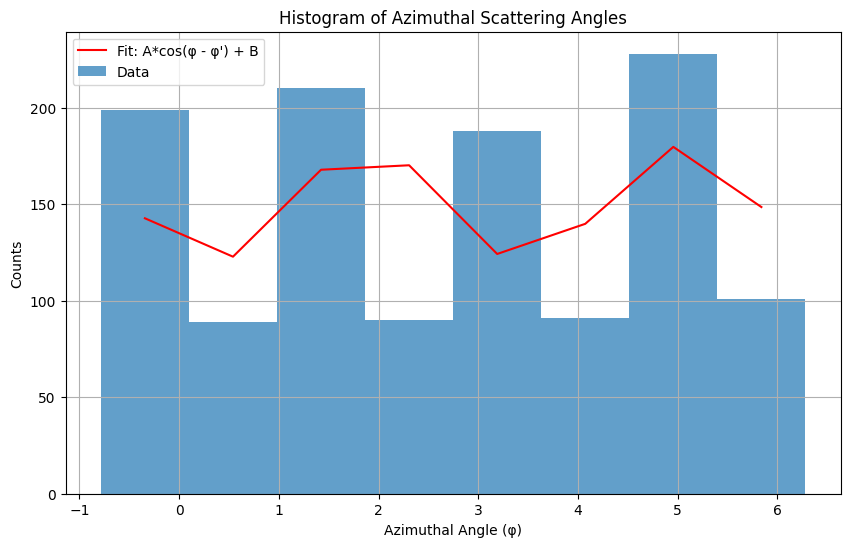

Fit parameters: A = -30.05, B = 150.00, φ' = 0.32


In [55]:
# Main simulation
num_photons = 10000
detector_size = (0.738, 0.738,0.5)  # cm
initial_energy = 200  # keV
polarization = [1, 0, 0]
incidence_angle = [0,0]  # radians

print("Starting simulation...")
start_time = time.time()
phi_values = simulate_detector(num_photons, detector_size, initial_energy, polarization, incidence_angle)
end_time = time.time()
print(f"Total simulation time: {end_time - start_time:.4f} seconds")
print(phi_values)
# Plotting code (if enough data is collected)
if len(phi_values) > 0:
    hist, bin_edges = np.histogram(phi_values, bins=8, range=(-np.pi/4, 8*np.pi/4))
    bin_centres = (bin_edges[:-1] + bin_edges[1:]) / 2

    def fit_function(phi, A, B, phi_prime):
        return A * np.cos(2*(phi - phi_prime)) + B


    try:
        popt, _ = curve_fit(fit_function, bin_centres, hist,p0=[100,100, 0])
        print(popt)
        plt.figure(figsize=(10, 6))
        plt.bar(bin_centres, hist, width=bin_centres[1]-bin_centres[0], alpha=0.7, label='Data')
        plt.plot(bin_centres, fit_function(bin_centres, *popt), 'r-', label='Fit: A*cos(φ - φ\') + B')
        plt.xlabel('Azimuthal Angle (φ)')
        plt.ylabel('Counts')
        plt.title('Histogram of Azimuthal Scattering Angles')
        plt.legend()
        plt.grid(True)
        plt.show()

        print(f"Fit parameters: A = {popt[0]:.2f}, B = {popt[1]:.2f}, φ' = {popt[2]:.2f}")
    except:
        print("Not enough data to perform curve fitting.")
else:
    print("No phi values collected. Unable to create histogram or perform fitting.")

In [59]:
# Main simulation
num_photons = 10000
detector_size = (0.738, 0.738,0.5)  # cm
initial_energy = 200  # keV
polarization = [1, 0, 0]
incidence_angle = [0,0]  # radians

print("Starting simulation...")
start_time = time.time()
phi_values = simulate_detector(num_photons, detector_size, initial_energy, polarization, incidence_angle,randomise=True)
end_time = time.time()
print(f"Total simulation time: {end_time - start_time:.4f} seconds")
print(phi_values)
# Plotting code (if enough data is collected)
if len(phi_values) > 0:
    hist, bin_edges = np.histogram(phi_values, bins=8, range=(-np.pi/4, 8*np.pi/4))
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    def fit_function(phi, A, B, phi_prime):
        return A * np.cos(phi - phi_prime)**2 + B


    try:
        popt, _ = curve_fit(fit_function, bin_centres, hist,p0=[100,100, 0])
        print(popt)
        plt.figure(figsize=(10, 6))
        plt.bar(bin_centers, hist, width=bin_centers[1]-bin_centers[0], alpha=0.7, label='Data')
        plt.plot(bin_centers, fit_function(bin_centers, *popt), 'r-', label='Fit: A*cos(φ - φ\') + B')
        plt.xlabel('Azimuthal Angle (φ)')
        plt.ylabel('Counts')
        plt.title('Histogram of Azimuthal Scattering Angles')
        plt.legend()
        plt.grid(True)
        plt.show()

        print(f"Fit parameters: A = {popt[0]:.2f}, B = {popt[1]:.2f}, φ' = {popt[2]:.2f}")
    except:
        print("Not enough data to perform curve fitting.")

    # find and plot the best cosine fit for the histogram
else:
    print("No phi values collected. Unable to create histogram or perform fitting.")



Starting simulation...

Simulating photon 1/10000
Initial position: [ 0.06998798 -0.0523095   0.        ]
direction: [0. 0. 1.]
New position: [ 0.06998798 -0.0523095   1.00593884]
Photon escaped without interacting. Final position: [ 0.06998798 -0.0523095   0.        ]

Simulating photon 2/10000
Initial position: [ 0.04742504 -0.03452292  0.        ]
direction: [0. 0. 1.]
New position: [ 0.04742504 -0.03452292  0.10338701]
Compton scattering time: 0.0000 seconds
Rejection sampling iterations: 1
Scattering angle (theta): 2.2509 radians
Azimuthal angle (phi): 3.4115 radians
Energy before: 200.00 keV, Energy after: 122.14 keV
First interaction:
  Position: [ 0.04742504 -0.03452292  0.10338701]
  Scattering angle (θ): 128.97°
  Azimuthal angle (φ): 195.46°
  Energy after scattering: 122.14 keV
direction: [-0.74938762 -0.20728995 -0.62884742]
New position: [-0.1072347  -0.07730374 -0.02639547]
Photon escaped after first scattering
Total time for this photon: 0.0010 seconds
-----------------

<Figure size 1000x600 with 0 Axes>